# Problem 3 - Eigenfaces

## Problem statement

  Study the theory of PCA for small sample size problems, where the number of
  data points is smaller than the data space dimension. Choose an image
  database convert the images to grayscale and apply the theory of ‘PCA for
  small sample size problems’ for dimensionality reduction.

  - (a) If $x$ is the sample mean (centroid of the dataset) and $p_1$ is the
  principal component, visualize the result of expression:

  $$
    x = \bar{x} + \alpha p_1
  $$

  where α ∈ {$−β \sqrt{λ}_1$ , 0, $β \sqrt{λ}_1$ } with $\lambda_1$ being the eigenvalue associated to $p_1$ and $\beta$ a scalar factor

  - (b) Study the spectrum of the matrix $X^T X$ to perform dimensionality reduction. Visualize some
  images in the space of reduced dimension.

  - (c) Constuct an image generator using the $d$ principal components choosen in item b.


In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("default")

from pathlib import Path

# Loading FEI faces

The choosen dataset is the **FEI faces database** which is a collection of 400 pictures of 200 persons, for each person there is a smiling picture and a neutral picture. We will be loading it into a single $X$ matrice that will have all of the data.

The data can be found at [FEI Face Database](https://fei.edu.br/~cet/facedatabase.html). The specific files being:

- https://fei.edu.br/~cet/frontalimages_spatiallynormalized_cropped_equalized_part1.zip
- https://fei.edu.br/~cet/frontalimages_spatiallynormalized_cropped_equalized_part2.zip

To use it download the two links, unzip into a folder and set the PATH variable below to this folder.

In [2]:
# Setting common use variables

PATH = Path("/home/jpsrocha/Documents/Data/FEI_faces_norm/")
FIG_DIR = Path("../res/ML_Exercises/GB500/exercise_list_2/report/figures/")
IMAGE_FILES = sorted(Path(PATH).glob("*.jpg"))
N = len(IMAGE_FILES)
example = plt.imread(IMAGE_FILES[1])

# Creating smile identifier array
is_smilling = np.array([[True if path.name.split(".")[0][-1] == "b" else False for path in IMAGE_FILES]])

# Uncomment to look at all images
# for i in range(1, 400, 2):
#     plt.imshow(plt.imread(IMAGE_FILES[i]).mean(axis=2), cmap="gray")
#     plt.title(i)
#     plt.show()

Let's look at an example.

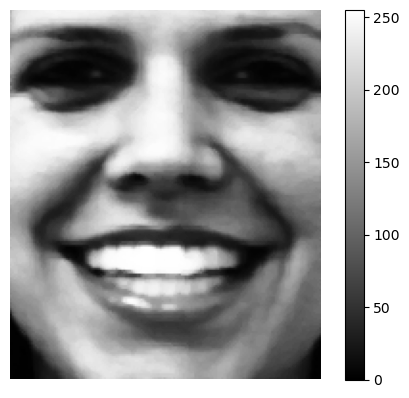

In [3]:
plt.imshow(example, cmap="gray")
plt.axis("off");
plt.colorbar()
plt.savefig(FIG_DIR / Path("example.png"), dpi=100)

Let's now load all the images as line vectors and concatenate into one giant matrix.

In [4]:
imgs = []

for img in IMAGE_FILES:
    imgs.append(plt.imread(img).reshape(1, -1))  # Loading and reshaping

X = np.vstack(imgs)

del imgs  # Deleting images to save space

In [5]:
# Looking at resulting shapes
example.reshape(1, -1).shape, X.shape

((1, 31266), (400, 31266))

# Starting PCA

To start things up, let's compute the "average face" of the dataset.

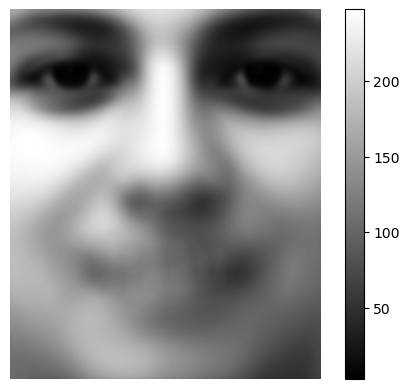

In [6]:
X_bar = np.mean(X, axis=0)

plt.imshow(X_bar.reshape(example.shape), cmap="gray")
plt.axis("off")
plt.colorbar()

plt.savefig(FIG_DIR / Path("face_media.png"), dpi=100)

In [7]:
# Using SVD

U, S, Vt = np.linalg.svd((X-X_bar[np.newaxis, :])/np.sqrt(len(IMAGE_FILES)), full_matrices=False)

S = np.diag(S)

In [8]:
# Using small sample PCA

A = (X-X_bar[np.newaxis, :])
AAt = A@A.T/(N-1)

eigvals, eigvec =  np.linalg.eigh(AAt)
eigvals = eigvals[-1::-1]
eigvecs = eigvec[:, -1::-1]

P_pca = A.T@eigvecs
P_pca = P_pca/np.linalg.norm(P_pca, axis=0)

In [9]:
P_pca.shape

(31266, 400)

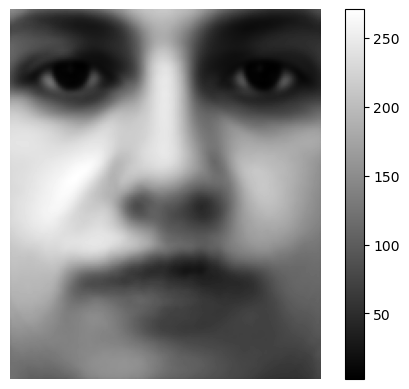

In [10]:
eig_n = 0

plt.imshow( (1.5*np.sqrt(eigvals[eig_n])*P_pca[:, eig_n] + X_bar).reshape(example.shape), cmap="gray")

plt.axis("off")
plt.colorbar()

plt.savefig(FIG_DIR / Path("pc1.png"), dpi=100)

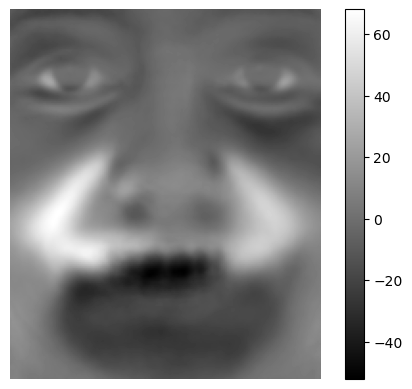

In [11]:
eig_n = 0

plt.imshow( (np.sqrt(eigvals[eig_n])*P_pca[:, eig_n]).reshape(example.shape), cmap="gray")

plt.axis("off")
plt.colorbar()

plt.savefig(FIG_DIR / Path("pure_pc1.png"), dpi=100)

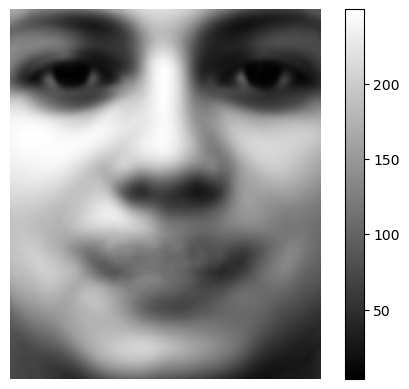

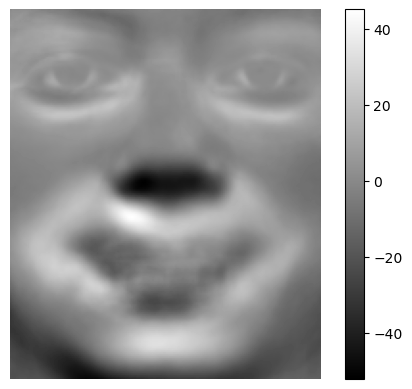

In [12]:
eig_n = 1

plt.imshow( (1.5*np.sqrt(eigvals[eig_n])*P_pca[:, eig_n] + X_bar).reshape(example.shape), cmap="gray")

plt.axis("off")
plt.colorbar()

plt.savefig(FIG_DIR / Path("pc2.png"), dpi=100)

plt.show()


plt.imshow( (np.sqrt(eigvals[eig_n])*P_pca[:, eig_n]).reshape(example.shape), cmap="gray")

plt.axis("off")
plt.colorbar()

plt.savefig(FIG_DIR / Path("pure_pc2.png"), dpi=100)

# Checking results via Small Sample PCA

Let's start by checking the cumulative explained variance.

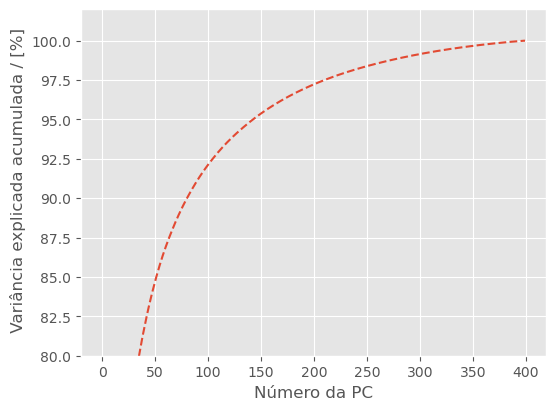

In [13]:
from matplotlib import patches

plt.style.use("ggplot")

cum_explained_var = np.cumsum(eigvals)/ np.sum(eigvals)*100

plt.figure(figsize=(6, 4.5))
plt.plot(cum_explained_var, "--")

plt.xlabel("Número da PC")
plt.ylabel(" Variância explicada acumulada / [%]")
plt.ylim(80, 102)

# axins = plt.gca().inset_axes(
#     [0.5, 0.3, 0.3, 0.3],
#     xlim=(30, 350), ylim=(85, 100), yticks=np.linspace(85, 100, 8))
# n = 30
# axins.plot(range(n, 400), cum_explained_var[n:], "--")

# patch = patches.Rectangle((30, 86), 400-30, 100-85, facecolor="none", edgecolor="k")

# plt.gca().add_patch(patch)


plt.savefig(FIG_DIR / Path("var_explained.png"), dpi=100)

In [14]:
for i, c in enumerate(cum_explained_var, start=1):
    print(i, "--", c)

1 -- 17.891334117582655
2 -- 27.065487091464757
3 -- 32.31707003373628
4 -- 37.21940204099356
5 -- 41.749113688947915
6 -- 45.73538075945518
7 -- 49.40903060810008
8 -- 52.29196680933954
9 -- 54.90544038379369
10 -- 57.15593748684511
11 -- 59.30997460364318
12 -- 61.09239365774383
13 -- 62.8032418777521
14 -- 64.31767844803137
15 -- 65.64679325857637
16 -- 66.92360634841651
17 -- 68.05181335964949
18 -- 69.08204606110232
19 -- 70.03366960751372
20 -- 70.94549145809974
21 -- 71.82219678478143
22 -- 72.59353432040983
23 -- 73.30422439694652
24 -- 73.98472307949046
25 -- 74.64025165332099
26 -- 75.24832149756412
27 -- 75.82946271567891
28 -- 76.38699078836616
29 -- 76.91745567586564
30 -- 77.42711515719432
31 -- 77.93400096006093
32 -- 78.41399708930953
33 -- 78.86127589161931
34 -- 79.28930328500459
35 -- 79.70375292506134
36 -- 80.11364521763859
37 -- 80.49710647218764
38 -- 80.86512997827685
39 -- 81.22506834940245
40 -- 81.56071614091991
41 -- 81.89250680824742
42 -- 82.21701033606436

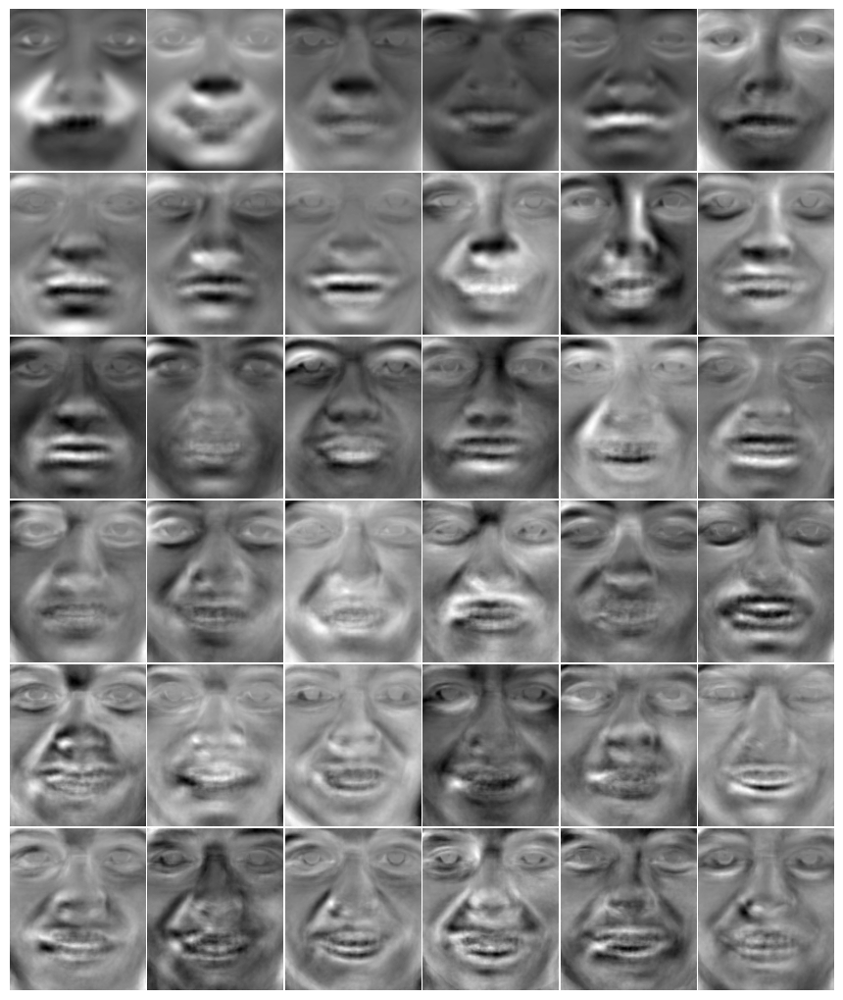

In [15]:
from mpl_toolkits.axes_grid1 import ImageGrid

fig = plt.figure(figsize=(10, 10))
axes = ImageGrid(fig, 111, nrows_ncols=(6, 6))

for i, ax in zip(range(len(axes)), axes):
    ax.imshow(P_pca[:, i].reshape(example.shape), cmap="gray")
    ax.axis("off")
    # ax.set_aspect("none")

plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)
plt.savefig(FIG_DIR / "eigenfaces.png", dpi=100)

In [16]:
A_transform = A@P_pca
A_transform.shape

(400, 400)

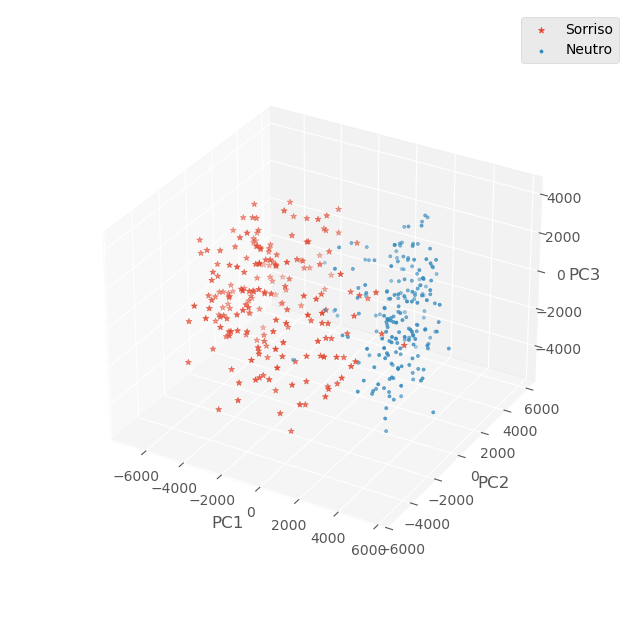

In [17]:
fig = plt.figure(figsize=(8, 8))

ax = fig.add_subplot(projection="3d")

ax.scatter(A_transform[is_smilling.ravel(), 0], A_transform[is_smilling.ravel(), 1], A_transform[is_smilling.ravel(), 2], marker="*", label="Sorriso")
ax.scatter(A_transform[~is_smilling.ravel(), 0], A_transform[~is_smilling.ravel(), 1], A_transform[~is_smilling.ravel(), 2], marker=".", label="Neutro")

# ax.set_xticks([])
# ax.set_yticks([])
# ax.set_zticks([])
plt.legend()
plt.xlabel("PC1")
plt.ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_box_aspect(None, zoom=0.8)

ax.set_facecolor('white')


plt.savefig(FIG_DIR / Path("pc123.png"), dpi=100)



In [18]:
P_pca.T.shape, A_transform[1, :].reshape(1, -1).shape

((400, 31266), (1, 400))

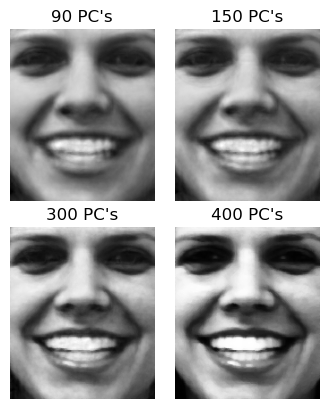

In [19]:
plt.style.use("default")

    
N_pcs = [90, 150, 300, 400]

fig, axes = plt.subplots(ncols=2, nrows=2)

for n, ax in zip(N_pcs, axes.ravel()):

    truncation_mat = np.diag(
        np.concatenate([np.ones(n), np.zeros(N-n)])
    )
    
    A_reconstruct = A_transform[1, :]@truncation_mat@P_pca.T
    
    
    ax.imshow((A_reconstruct+ X_bar).reshape(example.shape), cmap="gray")
    ax.axis("off")
    ax.set_title(f"{n} PC's")


plt.subplots_adjust(wspace=-0.5, hspace=0.15)

plt.savefig(FIG_DIR / Path("pca_reconstructions.png"), dpi=100)

# Generating faces

In [27]:
np.random.seed(10)

eigvals_mat = np.diag(0.75*eigvals)

random_vals = np.random.multivariate_normal(np.zeros(eigvals.shape[0]),eigvals_mat, size=100)

random_vals.shape

(100, 400)

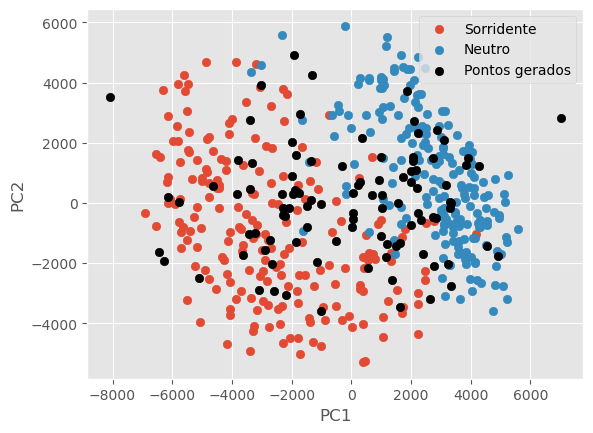

In [28]:
plt.style.use("ggplot")

fig, ax = plt.subplots()

pc1, pc2 = 0, 1

ax.scatter(A_transform[is_smilling.ravel(), pc1], A_transform[is_smilling.ravel(), pc2], label="Sorridente")
ax.scatter(A_transform[~is_smilling.ravel(), pc1], A_transform[~is_smilling.ravel(), pc2], label="Neutro")
ax.scatter(random_vals[:, pc1], random_vals[:, pc2], c="k", label="Pontos gerados")

plt.legend()
plt.xlabel(f"PC{pc1+1}")
plt.ylabel(f"PC{pc2+1}")

plt.savefig(FIG_DIR / Path("random_pc12.png"), dpi=100)

(400,)


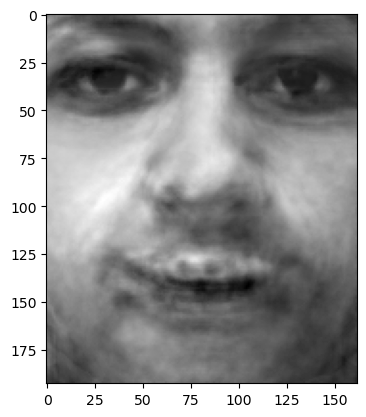

(400,)


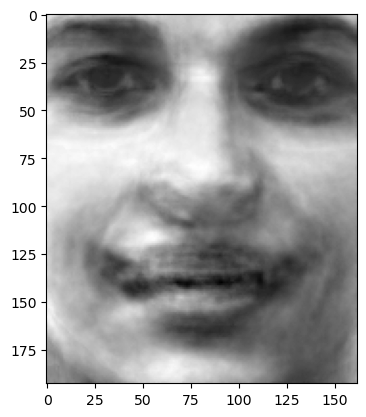

(400,)


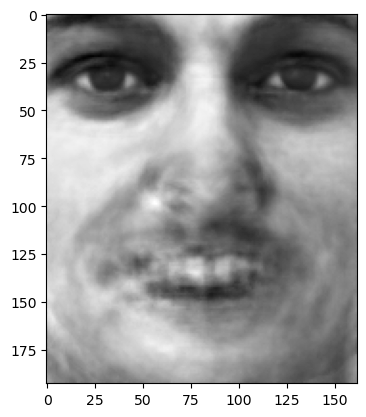

(400,)


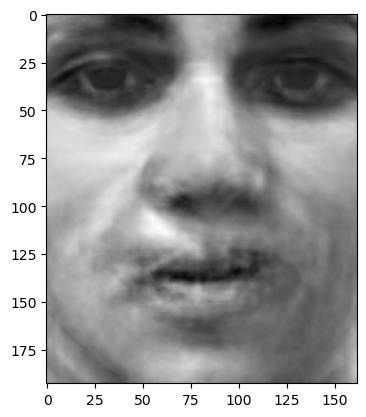

(400,)


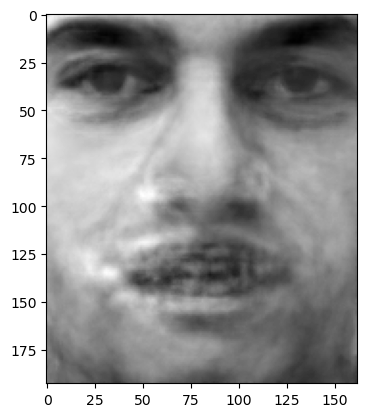

(400,)


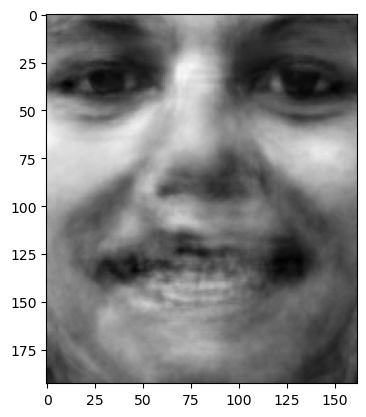

(400,)


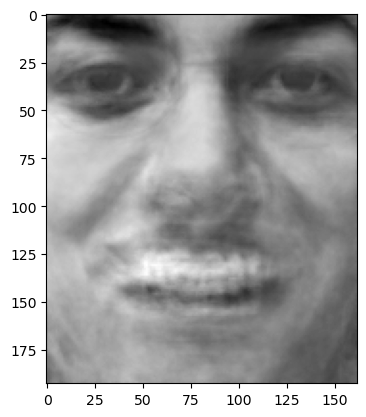

(400,)


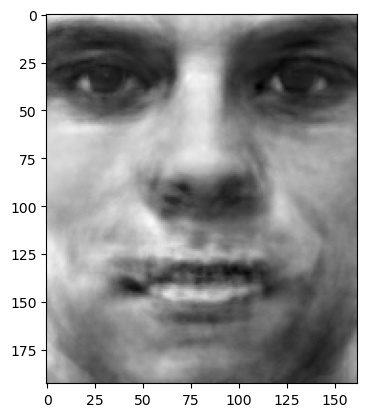

(400,)


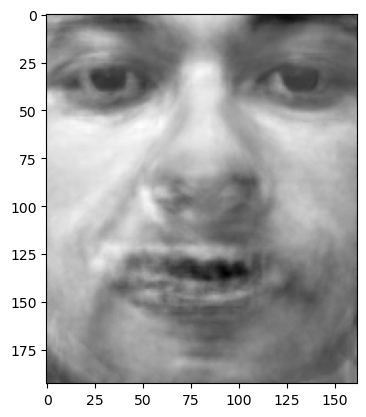

(400,)


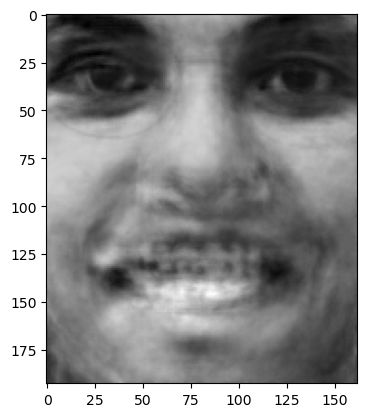

In [29]:
plt.style.use("default")

n = 300
truncation_mat = np.diag(
    np.concatenate([np.ones(n), np.zeros(N-n)])
)

for num in range(10):
    plt.imshow((random_vals[num].reshape(1, -1)@truncation_mat@P_pca.T + X_bar.reshape(1, -1)).reshape(example.shape), cmap="gray")
    print(random_vals[num].shape)
    plt.show()

# Refining the model

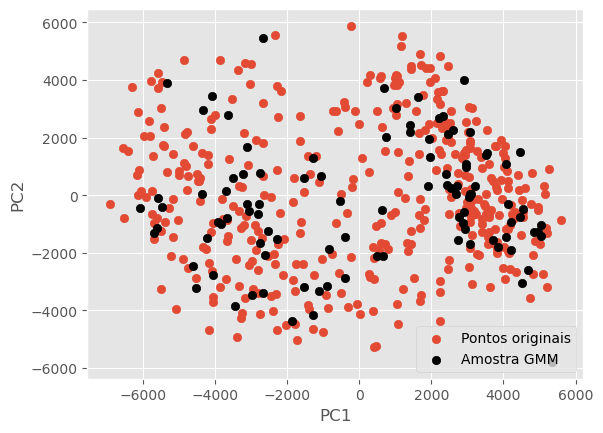

In [34]:
from sklearn.mixture import GaussianMixture
plt.style.use("ggplot")

np.random.seed(13)

GM = GaussianMixture(2)
GM.fit(A_transform[:, [0, 1]])

gm_sample, _ = GM.sample(100)

# Shuffling to make it easier to visualize both classes

np.random.seed(11)
np.random.shuffle(gm_sample)

np.random.seed(11)
np.random.shuffle(_)

pc1_s, pc2_s = gm_sample.T
pc1, pc2 = A_transform[:, [0, 1]].T

plt.scatter(pc1, pc2, label="Pontos originais")
plt.scatter(pc1_s, pc2_s, c="k", label="Amostra GMM")

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend()

plt.savefig(FIG_DIR / Path("sample_gmm.png"), dpi=100)

In [35]:
_

array([0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0,
       0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0,
       1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0,
       0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0])

In [36]:
random_vals[:, [0, 1]] = gm_sample

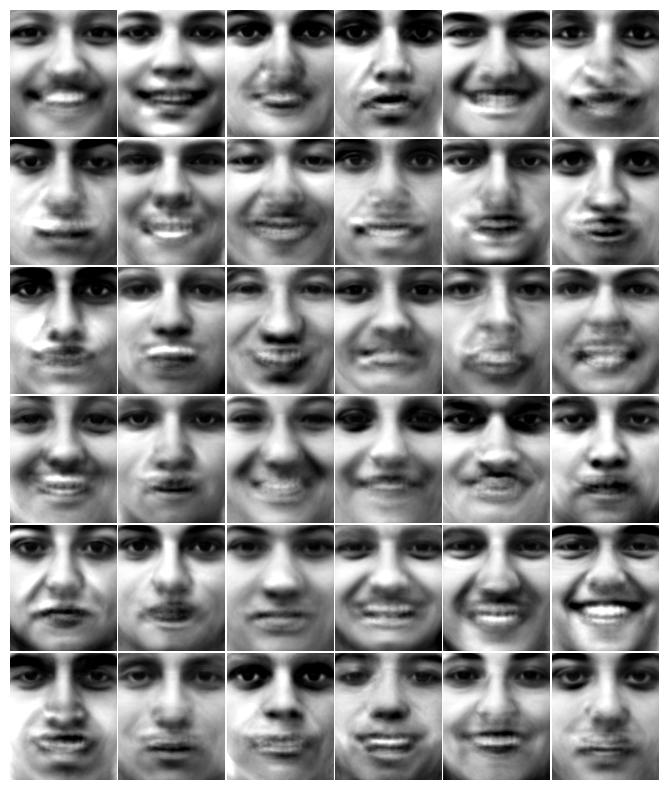

In [38]:
plt.style.use("default")

n = 50
truncation_mat = np.diag(
    np.concatenate([np.ones(n), np.zeros(N-n)])
)

from mpl_toolkits.axes_grid1 import ImageGrid

fig = plt.figure(figsize=(10, 10))
axes = ImageGrid(fig, 111, nrows_ncols=(6, 6))



for i, ax in zip(range(50), axes):
    im = (random_vals[i].reshape(1, -1)@truncation_mat@P_pca.T + X_bar.reshape(1, -1)).reshape(example.shape)
    im[im<0] = 0
    im[im>255] = 255
    ax.imshow(im, cmap="gray")
    ax.axis("off")

plt.savefig(FIG_DIR / Path("generated_faces.png"), dpi=100)

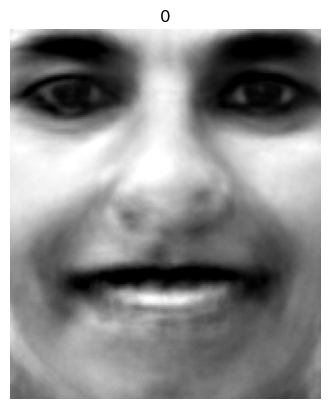

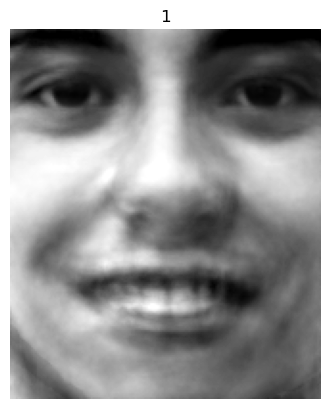

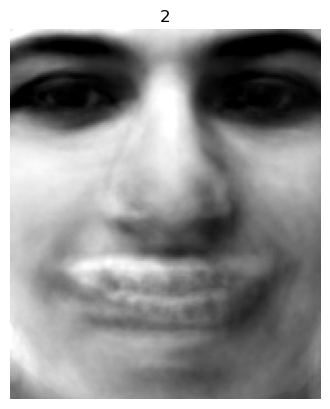

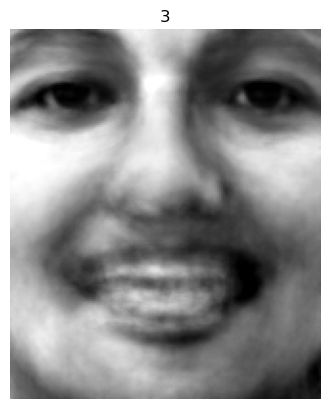

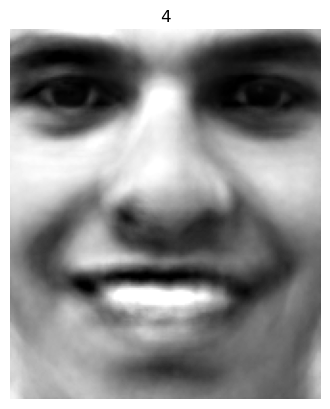

...

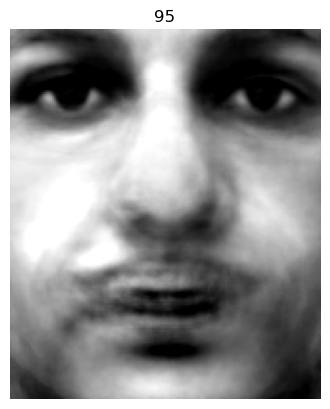

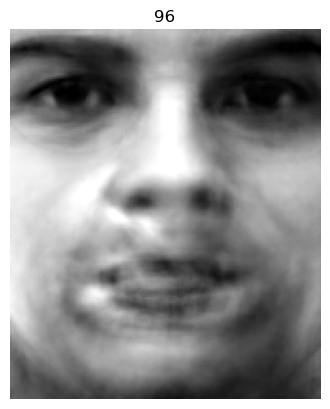

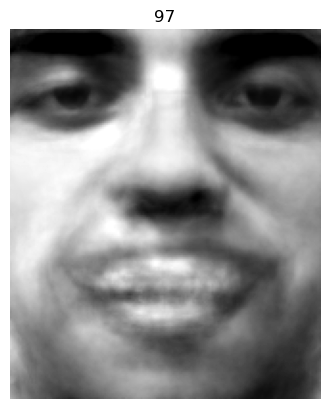

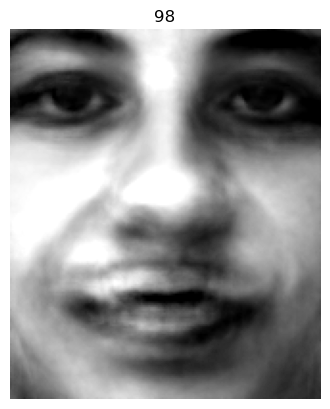

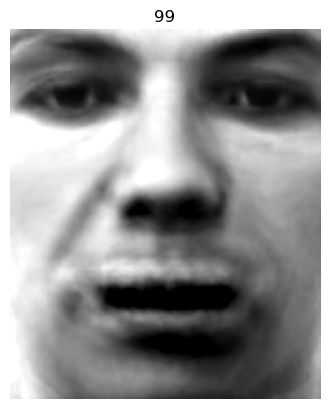

In [204]:
for i in range(100):
    im = (random_vals[i].reshape(1, -1)@truncation_mat@P_pca.T + X_bar.reshape(1, -1)).reshape(example.shape)
    im[im<0] = 0
    im[im>255] = 255
    plt.imshow(im, cmap="gray")
    plt.axis("off")
    plt.title(i)
    plt.show()

In [95]:
A_transform[[0, 1], :].shape

(2, 400)

In [83]:
import gc
gc.collect()

74687

In [80]:
(random_vals[num].reshape(1, -1)@P_pca.T).shape

(1, 31266)

In [ ]:
(A_transform[:, 0].reshape(1, -1)@P_pca.T).shape

In [ ]:
A_transform[:, 0].reshape(1, -1).shape

In [ ]:
plt.imshow(P_pca.T@P_pca)
reP_pca.T@P_pca@A_transform

In [ ]:
plt.imshow((A_transform[1, :]@P_pca.T).reshape(example.shape))

# Using GMM to improve results

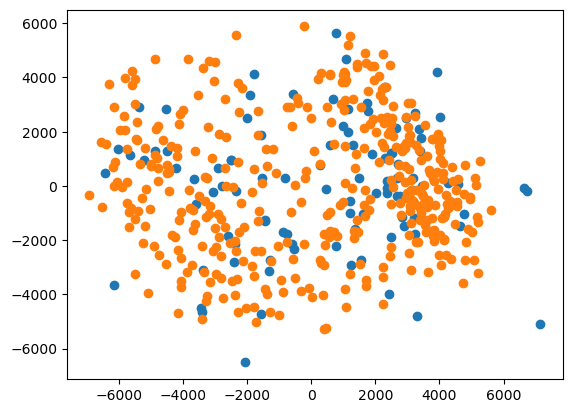

In [45]:

GM = GaussianMixture(2)
GM.fit(A_transform)


gm_sample, _ = GM.sample(100)

# Shuffling to make it easier to visualize both classes

np.random.seed(11)
np.random.shuffle(gm_sample)

p1, p2 = 0, 1
plt.scatter(gm_sample[:, p1], gm_sample[:, p2])
plt.scatter(A_transform[:, p1], A_transform[:, p2])

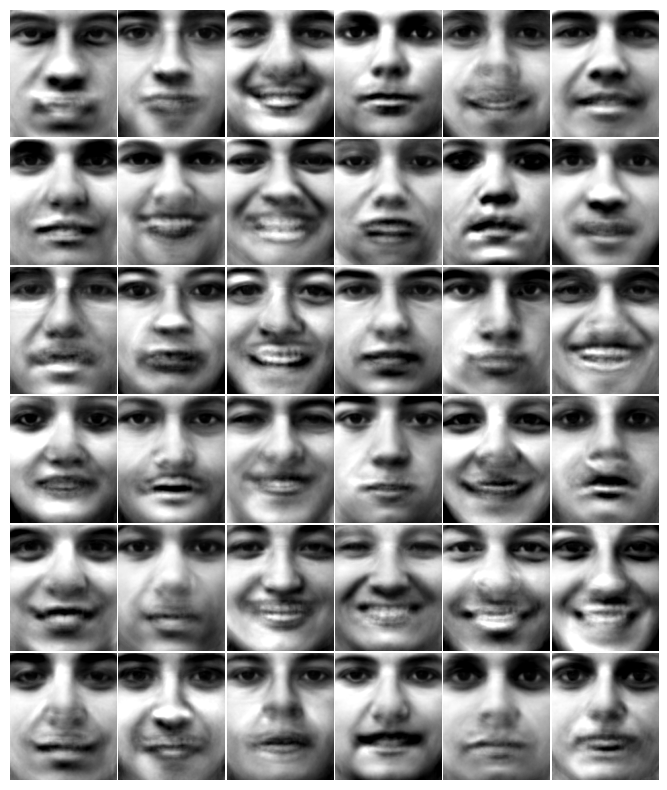

In [51]:
plt.style.use("default")

n = 50
truncation_mat = np.diag(
    np.concatenate([np.ones(n), np.zeros(N-n)])
)

from mpl_toolkits.axes_grid1 import ImageGrid

fig = plt.figure(figsize=(10, 10))
axes = ImageGrid(fig, 111, nrows_ncols=(6, 6))



for i, ax in zip(range(50), axes):
    im = (gm_sample[i].reshape(1, -1)@truncation_mat@P_pca.T + X_bar.reshape(1, -1)).reshape(example.shape)
    im[im<0] = 0
    im[im>255] = 255
    ax.imshow(im, cmap="gray")
    ax.axis("off")

plt.savefig(FIG_DIR / Path("generated_faces.png"), dpi=100)

# Avaliando resultados com SVD

In [ ]:
U.shape, S.shape, Vt.shape

In [ ]:
power = np.cumsum(np.diag(S))/ np.sum(S)

plt.plot(range(N), power[:N])

In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid

fig = plt.figure(figsize=(10, 10))
axes = ImageGrid(fig, 111, nrows_ncols=(6, 6))

for i, ax in zip(range(len(axes)), axes):
    ax.imshow(U[:, i].reshape(example.shape), cmap="gray")
    ax.axis("off")
    # ax.set_aspect("none")

plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)

In [ ]:
pcs = S[:2, :2]@Vt[:2, :]

pcs.shape

In [ ]:
pcs = S[:2, :2]@Vt[:2, :]
x, y = pcs


pcs = S[:2, :2]@Vt[:2, :14]
x2, y2 = pcs

pcs = S[:2, :2]@Vt[:2, 15:35]
x3, y3 = pcs

pcs = S[:2, :2]@Vt[:2, 24:26]
x4, y4 = pcs


fig = plt.figure(figsize=(7, 7))



plt.scatter(x, y, s=5, c="k", label="all")
plt.scatter(x2, y2, label="Selected woman")
plt.scatter(x3, y3, label="Selected man")
plt.scatter(x4, y4, s=30 ,c="green", label="Long hair guy")

plt.legend()

In [ ]:
from matplotlib.colors import LogNorm
C = (Vt@Vt.T)[:30, :30]
for i in range(len(C)):
    C[i, i] = 0
ax = plt.imshow(C)
plt.colorbar()

In [ ]:
(U@S).shape

In [ ]:
plt.imshow(
    (U@S@(Vt[:, 1].reshape(-1, 1))*np.sqrt(400-1) + X_bar.reshape(-1, 1))
    .reshape(example.shape),
    cmap="gray"
)

In [ ]:
U.shape, S.shape, Vt.shape

In [ ]:
new_faces = np.random.multivariate_normal(np.zeros(S.shape[0]), S*(len(IMAGE_FILES)-1), size=10).T

new_faces.shape

In [ ]:
S[:4, :4]

In [ ]:
from scipy.stats import norm


i = 2
vals = Vt[i, :]*S[i, i]
xs = np.linspace(np.min(vals), np.max(vals))
ys = norm.pdf(xs, loc=0, scale=np.sqrt(S[i, i]))



plt.hist(vals, density=True)
plt.scatter(xs, ys, c="k")

In [ ]:
edge, height

In [ ]:
h[0].shape, h[1].shape

In [ ]:
fig, axes = plt.subplots(ncols=5, nrows=5, sharex=True, sharey=True, figsize=(10, 10))

for i, ax in zip(range(len(axes.ravel())), axes.ravel()):
    ax.hist(S[i, i]*Vt[i, :])
    ax.set_title(f"PC{i}", fontsize=10)

plt.tight_layout()

In [ ]:
new_faces = np.random.multivariate_normal(np.zeros(S.shape[0]), S, size=100).T

pc1 = 0
pc2 = 1

pcs = S[1:3, 1:3]@Vt[1:3, :]
x, y = pcs
x2, y2, = new_faces[1:3, :]

plt.scatter(x, y)
plt.scatter(x2, y2)
plt.tight_layout()

In [ ]:

for i in range(3):
    plt.imshow(
        (U@S@(new_faces[:, i].reshape(-1, 1))*np.sqrt(400) + X_bar.reshape(-1, 1))
        .reshape(example.shape),
        cmap="gray"
    )
    plt.show()
    
    

In [ ]:
plt.style.use("default")

S2 = np.copy(S)

for i in range(350, len(IMAGE_FILES)):
    S2[i, i] = 0


eig_face =  0.75*np.random.multivariate_normal(np.zeros(S.shape[0]), S2, size=1).T


face = U@(eig_face)*np.sqrt(400) + X_bar.reshape(-1, 1)

# plt.imshow(
#     (U@S@(Vt[:, 1].reshape(-1, 1))*np.sqrt(400) + X_bar.reshape(-1, 1))
#     .reshape(example.shape),
#     cmap="gray"
# )
# plt.show()

plt.imshow(
    face.reshape(example.shape),
    cmap="gray"
)

In [ ]:
X_bar.reshape()

In [ ]:
S.shape, face.shape